## Quiz #0502

### "Human Activity Recognition" 

#### Answer the following questions by providing Python code:
#### Objectives:
- Carry out the EDA.
- Carry out the data pre-processing.
- Optimize and test a predictive model of your choice.

In [162]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn import metrics, preprocessing
warnings.filterwarnings(action='ignore')                  # Turn off the warnings.
%matplotlib inline

#### Read in data:
The explanation on the dataset can be found [here](https://archive.ics.uci.edu/ml/datasets/human+activity+recognition+using+smartphones).

In [163]:
# Go to the directory where the data file is located. 
# os.chdir(r'~~')                # Please, replace the path with your own. 

In [164]:
df = pd.read_csv('data/data_human activity recognition.csv', header='infer')

In [165]:
df.shape

(19622, 160)

In [166]:
df.columns

Index(['Unnamed: 0', 'user_name', 'raw_timestamp_part_1',
       'raw_timestamp_part_2', 'cvtd_timestamp', 'new_window', 'num_window',
       'roll_belt', 'pitch_belt', 'yaw_belt',
       ...
       'gyros_forearm_x', 'gyros_forearm_y', 'gyros_forearm_z',
       'accel_forearm_x', 'accel_forearm_y', 'accel_forearm_z',
       'magnet_forearm_x', 'magnet_forearm_y', 'magnet_forearm_z', 'classe'],
      dtype='object', length=160)

1). Carry out the EDA. Check for the missing values. HINT: The response variable is 'classe'.

In [167]:
print("We have a %d columns a lot of missing values."% (df.isna().sum() > 0).sum())
print("Total missing values: %d" % (df.isna().sum().sum()))
print("Our target [Classe] is missing %d values." % df.classe.isna().sum())

We have a 100 columns a lot of missing values.
Total missing values: 1921600
Our target [Classe] is missing 0 values.


In [168]:
# <Your code goes in here>
missing_percentage = pd.Series(df.isna().sum()/df.shape[0])

2). Get rid of the columns that have more than 97% missing values.

In [169]:
# <Your code goes in here>
dropped_cols = missing_percentage[missing_percentage >= 0.97].index

df.drop(dropped_cols, axis=1, inplace=True)

3). Get rid of the unnecessary columns. HINT: Those columns with "time" in the name and those that are obviously unnecessary.

In [170]:
df.head().T

,0,1,2,3,4
Unnamed: 0,1,2,3,4,5
user_name,carlitos,carlitos,carlitos,carlitos,carlitos
raw_timestamp_part_1,1323084231,1323084231,1323084231,1323084232,1323084232
raw_timestamp_part_2,788290,808298,820366,120339,196328
cvtd_timestamp,05/12/2011 11:23,05/12/2011 11:23,05/12/2011 11:23,05/12/2011 11:23,05/12/2011 11:23
new_window,no,no,no,no,no
num_window,11,11,11,12,12
roll_belt,1.41,1.41,1.42,1.48,1.48
pitch_belt,8.07,8.07,8.07,8.05,8.07
yaw_belt,-94.4,-94.4,-94.4,-94.4,-94.4


In [171]:
# <Your code goes in here>
# Columns with "time" in their names
dropped_time_cols = list(df.columns[df.columns.map(lambda name: "time" in name)])
# dropped_time_cols
new_dropped_cols = ["Unnamed: 0", "user_name", "new_window", "num_window"] + dropped_time_cols
# new_dropped_cols
df.drop(new_dropped_cols, axis=1, inplace=True)

In [172]:
df.shape

(19622, 53)

4). Label encode the responde variable. HINT: use preprocessing.LabelEncoder(). 

In [173]:
# <Your code goes in here>
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
df.classe = encoder.fit_transform(df.classe)

## Visualization

<Figure size 1080x1080 with 0 Axes>

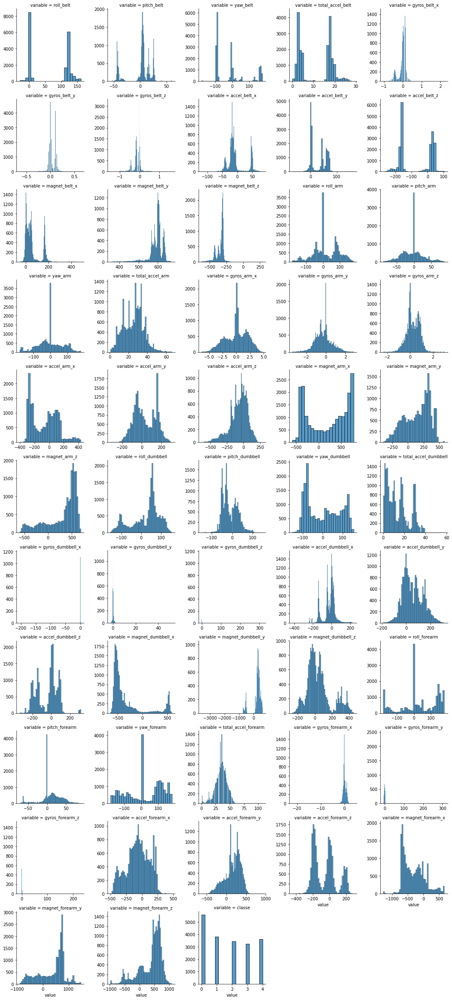

In [174]:
plt.figure(figsize=(15,15))
f = pd.melt(df)
facet = sns.FacetGrid(f, col_wrap=5, col="variable", sharex=False, sharey=False)
facet = facet.map(sns.histplot, "value", kde=False)
plt.show()

5). Carry out min-max scaling of the exploratory variables. HINT: use preprocessing.MinMaxScaler().

In [176]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[df.columns[:-1]] = scaler.fit_transform(df.drop("classe", axis=1))

6). Choose an algorithm and carry out the predictive analysis.

- Optimize the hyperparameter(s)
- Calculate the accuracy.
- Aim for upper 90% accuracy.

In [181]:
# <Your code goes in here>

X_train, X_test, Y_train, Y_test = train_test_split(df.drop("classe", axis=1), df.classe, test_size=0.2)
parameters = {"max_depth": range(4,10), "min_samples_leaf": range(1, 5), "bootstrap": [True, False]}
gridCV = GridSearchCV(estimator=RandomForestClassifier(random_state=123, n_jobs=-1), param_grid=parameters)

gridCV.fit(X_train, Y_train)

Y_pred = gridCV.predict(X_test)
print( "Random Forest Classifier accuracy : " + str(np.round(metrics.accuracy_score(Y_test,Y_pred),3)))

Random Forest Classifier accuracy : 0.928


In [180]:
print("Best parameters for Random Forest Classifer are: ", gridCV.best_params_)

Best parameters for Random Forest Classifer are:  {'bootstrap': True, 'max_depth': 9, 'min_samples_leaf': 1}
